# Changed
Layers 3 and 4 have a very slow learning rate now


In [6]:
ls

axsys@  dev/     home/   local/  mnt/  proc/  sbin@     srv/  usr/
bin@    engram/  lib@    media/  net/  root/  scratch@  sys/  var/
boot/   etc/     lib64@  misc/   opt/  run/   share/    tmp/


# Knowledge Assembly

In [1]:
from nellinetworkconjunctive import Network
from helpers import fit_sigmoid, mean_squared_error, rotate, load_behavioural_data
from plotting import plotting_init, matrix_plot, mds_plot

import torch
import numpy as np
from scipy.special import expit
from sklearn import manifold
from sklearn.metrics import euclidean_distances

import matplotlib.pyplot as plt
import seaborn as sns

from multiprocessing import Pool

ModuleNotFoundError: No module named 'nellinetworkconjunctive'

In [ ]:
pwd

'/share/ctn/users/lc3616'

## Load behavioural data

In [2]:
midd_performance, high_performers, low_performers = load_behavioural_data("./behavioural-data/")

## Set simulation mode

In [3]:
mode = "main" # "lazy-regime", "two-readouts", "fixed-inputs"

## Set Hyperparameters

In [4]:
# Random seeds
seeds_n = 10
mds_seed = 1

# Number of input items
items_n = 7

# Experiment details
training_blocks = 16 if mode == "two-readouts" else 8
trials = 60
training_length = 2 * training_blocks * trials
stitching_steps = 20

# Network hyperparameters
readouts = 2 if mode == "two-readouts" else 1
h1_size = 20

if mode == "lazy-regime":
    w1_weight_std = np.sqrt(6. / items_n)
    w2_weight_std = np.sqrt(10. / h1_size)
else:
    w1_weight_std = 0.025 * np.sqrt(1 / items_n)
    w2_weight_std = np.sqrt(1 / h1_size)

learning_rate = 0.03 if mode == "lazy-regime" else 0.05
learning_rate_layers_3_4 = 1e-3

# Parameter space for gridsearch
gammas = np.concatenate([[0], np.geomspace(1e-4, 1, 69)])
ss = np.geomspace(1e-2, 100, 65)

## Train Networks

In [5]:
items_per_context = 7
training_pairs = np.asarray(list(zip(range(0, items_per_context - 1), range(1, items_per_context))))

In [ ]:
gamma = 0

def train_networks(gamma):
    # Log
    results = {
        "train": {
            "losses": np.zeros((seeds_n, training_length)),
            "w1s": np.zeros((seeds_n, training_length, h1_size, items_n)),
            "w2s": np.zeros((seeds_n, training_length, readouts, h1_size)),
            "h1s": np.zeros((seeds_n, training_length, items_n, h1_size)),
            "certainties": np.zeros((seeds_n, training_length, items_n, items_n)),
            "evals": np.zeros((seeds_n, items_n, items_n)),
        },
        # "stitch": {
        #     "losses": np.zeros((seeds_n, stitching_steps)),
        #     "w1s": np.zeros((seeds_n, stitching_steps, h1_size, items_n)),
        #     "w2s": np.zeros((seeds_n, stitching_steps, readouts, h1_size)),
        #     "certainties": np.zeros((seeds_n, stitching_steps, items_n, items_n)),
        #     "h1s": np.zeros((seeds_n, stitching_steps, items_n, h1_size)),
        #     "evals": np.zeros((seeds_n, items_n, items_n)),
        # }
    }
    
    results["train"]["training_progress"] = np.zeros((seeds_n, training_length, items_n, items_n))
    
    for seed in range(seeds_n):
        np.random.seed(seed)
        torch.manual_seed(seed)

        # Init Network
        model = Network(items_n, h1_size, w1_weight_std, w2_weight_std, readouts=readouts)
        criterion = torch.nn.MSELoss()
        optimiser = torch.optim.SGD([
            {'params': [*model.layer_1.parameters(), *model.layer_2.parameters()], 'lr': learning_rate},
            {'params': [*model.layer_3.parameters(), *model.layer_4.parameters()], 'lr': learning_rate_layers_3_4}
        ])

        training_step = 0
        items_per_context = items_n
        
        for block in range(training_blocks): 
            items_per_context = 7
            training_pairs = np.asarray(list(zip(range(0, items_per_context - 1), range(1, items_per_context))))
            for trial in range(trials):
                # Sample input and target
                random_index = np.random.randint(0, len(training_pairs))
                item_1, item_2 = np.random.choice(training_pairs[random_index], 2, False)
                if readouts == 1:
                    target = torch.tensor([1. if item_1 > item_2 else -1.])
                elif readouts == 2:
                    target = torch.tensor([1., -1.] if item_1 > item_2 else [-1., 1.])

                # Forward propagate and backpropagate
                optimiser.zero_grad()
                _, output = model(item_1, item_2)
                model.loss = criterion(output, target)
                model.loss.backward()
                model.correct(learning_rate, gamma)
                optimiser.step()

                # Log
                with torch.no_grad():
                    results["train"]["losses"][seed, training_step] = model.loss.item()
                    results["train"]["w1s"][seed, training_step] = model.layer_1.weight.detach().numpy().copy()
                    results["train"]["w2s"][seed, training_step] = model.layer_2.weight.detach().numpy().copy()
                    results["train"]["h1s"][seed, training_step] = model.extract_h1s()
                    results["train"]["certainties"][seed, training_step] = model.pairwise_certainty.a.copy()
                    results["train"]["training_progress"][seed, training_step] = model.evaluate()
                
                training_step += 1
        
        # Evaluate
        with torch.no_grad():
            results["train"]["evals"][seed] = model.evaluate()

    return gamma, results


In [7]:
results = train_networks(.1)
# results = {gamma: result for gamma, result in results}
print(results)

(0.1, {'train': {'losses': array([[1.01989698, 1.03927529, 0.99764329, ..., 0.        , 0.        ,
        0.        ],
       [0.99106175, 1.08988523, 0.98682493, ..., 0.        , 0.        ,
        0.        ],
       [0.9967531 , 1.01981997, 1.04566777, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [1.01046491, 0.98751724, 0.96658993, ..., 0.        , 0.        ,
        0.        ],
       [0.98900306, 1.02432203, 0.99161375, ..., 0.        , 0.        ,
        0.        ],
       [1.01061952, 1.06992853, 0.99144471, ..., 0.        , 0.        ,
        0.        ]], shape=(10, 960)), 'w1s': array([[[[ 9.70296562e-04, -4.56399471e-03, -2.46428722e-03, ...,
           2.68506631e-02, -3.87730524e-02, -5.54951373e-03],
         [ 5.67313796e-03,  8.27027659e-04,  6.64884970e-03, ...,
          -1.60209145e-02,  2.34396243e-03,  5.59911085e-03],
         [-1.09438794e-02,  3.37908976e-04, -3.49097420e-03, ...,
           2.40994315e-03,  2.58899131e-03, -5.30

# Plot

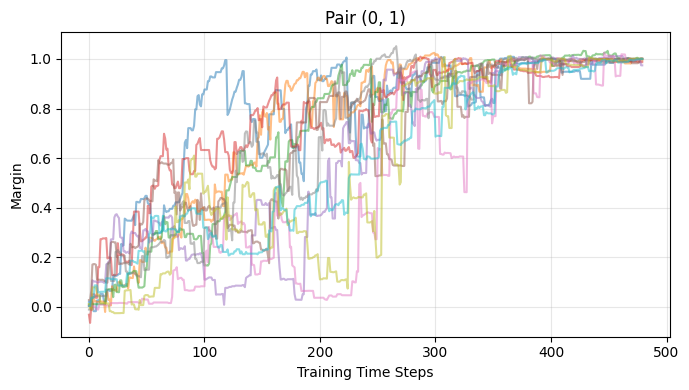

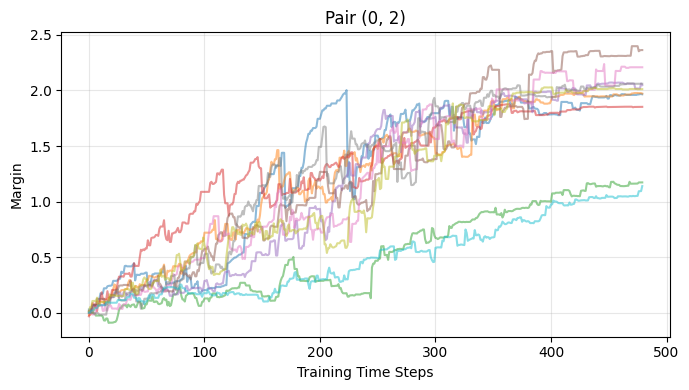

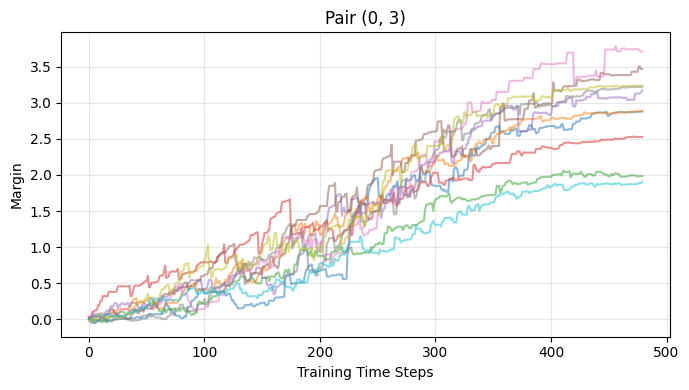

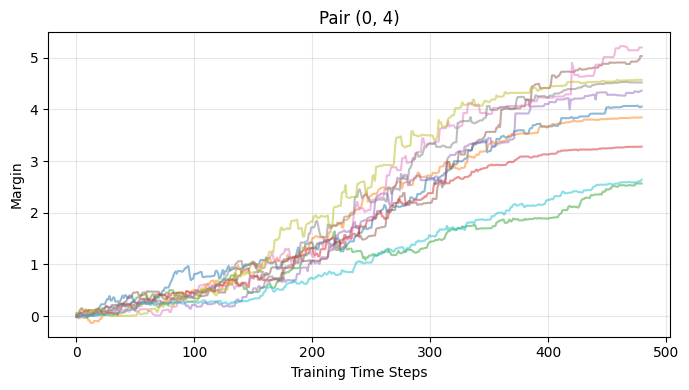

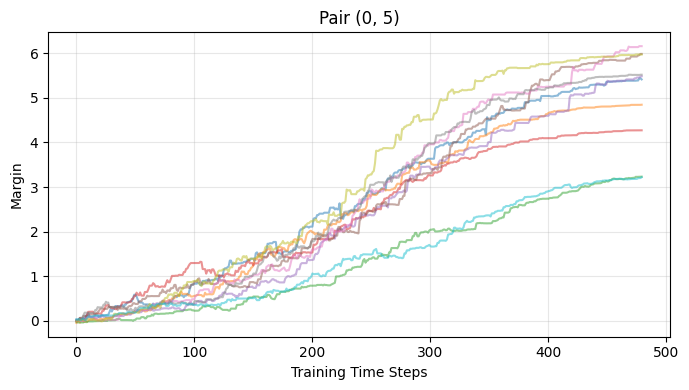

...

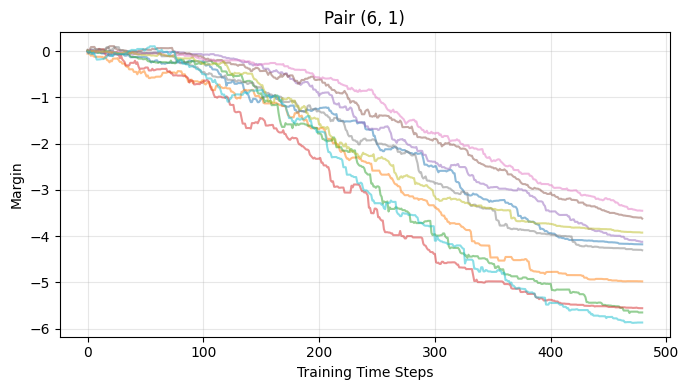

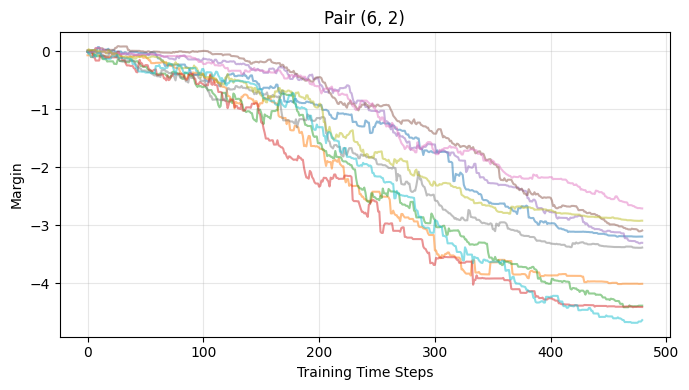

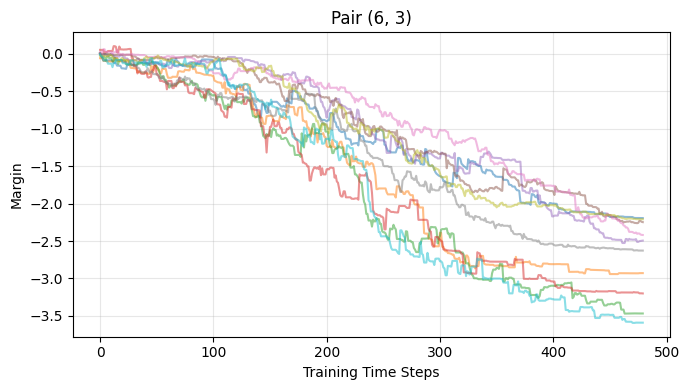

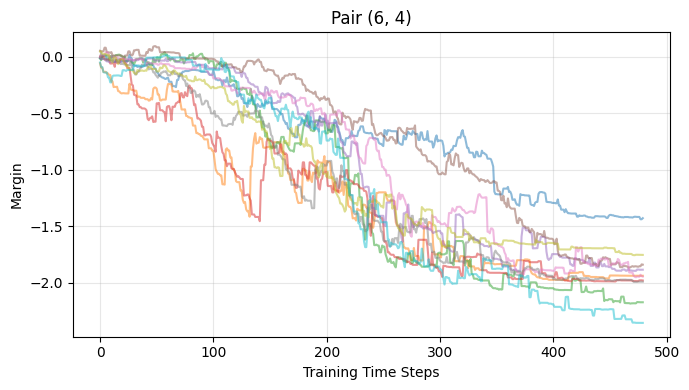

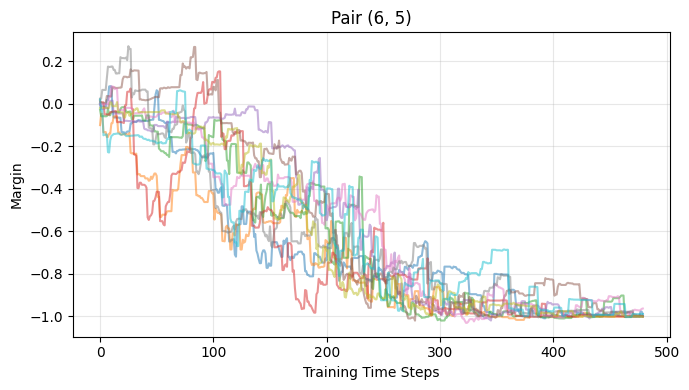

In [8]:
# Plot for every possible pair (i, j) in different figures
# If results is a tuple, unpack it to get the actual results dict
if isinstance(results, tuple):
    results = results[1]
training_progress = results["train"]["training_progress"]
seeds_n = training_progress.shape[0]
items_n = training_progress.shape[2]

for i in range(items_n):
    for j in range(items_n):
        if i == j:
            continue  # skip diagonal if desired
        plt.figure(figsize=(7,4))
        for seed in range(seeds_n):
            plt.plot(training_progress[seed, :480, i, j], alpha=0.5)
        plt.xlabel("Training Time Steps")
        plt.ylabel("Margin")
        plt.title(f"Pair ({i}, {j})")
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

TI Exp with conjunctive population

In [ ]:
gamma = 0

def train_networks_exp(gamma):
    # Log
    results = {
        "train": {
            "losses": np.zeros((seeds_n, training_length)),
            "w1s": np.zeros((seeds_n, training_length, h1_size, items_n)),
            "w2s": np.zeros((seeds_n, training_length, readouts, h1_size)),
            "h1s": np.zeros((seeds_n, training_length, items_n, h1_size)),
            "certainties": np.zeros((seeds_n, training_length, items_n, items_n)),
            "evals": np.zeros((seeds_n, items_n, items_n)),
        },
    }
    
    results["train"]["training_progress"] = np.zeros((seeds_n, training_length, items_n, items_n))
    
    for seed in range(seeds_n):
        np.random.seed(seed)
        torch.manual_seed(seed)

        # Init Network
        model = Network(items_n, h1_size, w1_weight_std, w2_weight_std, readouts=readouts)
        criterion = torch.nn.MSELoss()
        optimiser = torch.optim.SGD([
            {'params': [*model.layer_1.parameters(), *model.layer_2.parameters()], 'lr': learning_rate},
            {'params': [*model.layer_3.parameters(), *model.layer_4.parameters()], 'lr': learning_rate_layers_3_4}
        ])

        training_step = 0
        items_per_context = items_n
        
        for block in range(training_blocks): 
            items_per_context = 7
            p = 4
            q = 2
            training_pairs_norm = np.asarray(list(zip(range(0, items_per_context - 1), range(1, items_per_context))))
            training_pairs_exp = np.asarray([[p,q]])
            training_pairs = np.concatenate([training_pairs_norm, training_pairs_exp], axis=0)
            for trial in range(trials):
                # Sample input and target
                random_index = np.random.randint(0, len(training_pairs))
                item_1, item_2 = np.random.choice(training_pairs[random_index], 2, False)
                if readouts == 1:
                    if item_1 == p and item_2 == q or item_1 == q and item_2 == p:
                        exception = True
                    else:
                        exception = False
                    if not exception:
                        target = torch.tensor([1. if item_1 > item_2 else -1.])
                    else:
                        target = torch.tensor([-1. if item_1 > item_2 else 1.])

                #UNCHANGED SO FAR
                elif readouts == 2:
                    target = torch.tensor([1., -1.] if item_1 > item_2 else [-1., 1.])


                # Forward propagate and backpropagate
                optimiser.zero_grad()
                _, output = model(item_1, item_2)
                model.loss = criterion(output, target)
                model.loss.backward()
                model.correct(learning_rate, gamma)
                optimiser.step()

                # Log
                with torch.no_grad():
                    results["train"]["losses"][seed, training_step] = model.loss.item()
                    results["train"]["w1s"][seed, training_step] = model.layer_1.weight.detach().numpy().copy()
                    results["train"]["w2s"][seed, training_step] = model.layer_2.weight.detach().numpy().copy()
                    results["train"]["h1s"][seed, training_step] = model.extract_h1s()
                    results["train"]["certainties"][seed, training_step] = model.pairwise_certainty.a.copy()
                    results["train"]["training_progress"][seed, training_step] = model.evaluate()
                
                training_step += 1
        
        # Evaluate
        with torch.no_grad():
            results["train"]["evals"][seed] = model.evaluate()
        
    return gamma, results



In [ ]:
results = train_networks_exp(.1)

(0.1, {'train': {'losses': array([[1.01989698, 1.03927529, 0.99764329, ..., 0.        , 0.        ,
        0.        ],
       [0.99106175, 1.08988523, 0.98682493, ..., 0.        , 0.        ,
        0.        ],
       [0.9967531 , 1.01981997, 0.96761298, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [1.01046491, 0.99480176, 1.03750241, ..., 0.        , 0.        ,
        0.        ],
       [0.98900306, 1.02432203, 0.99161375, ..., 0.        , 0.        ,
        0.        ],
       [1.01408732, 0.87924314, 0.89509279, ..., 0.        , 0.        ,
        0.        ]], shape=(10, 960)), 'w1s': array([[[[ 9.70296562e-04, -4.56399471e-03, -2.46428722e-03, ...,
           2.68506631e-02, -3.87730524e-02, -5.54951373e-03],
         [ 5.67313796e-03,  8.27027659e-04,  6.64884970e-03, ...,
          -1.60209145e-02,  2.34396243e-03,  5.59911085e-03],
         [-1.09438794e-02,  3.37908976e-04, -3.49097420e-03, ...,
           2.40994315e-03,  2.58899131e-03, -5.30

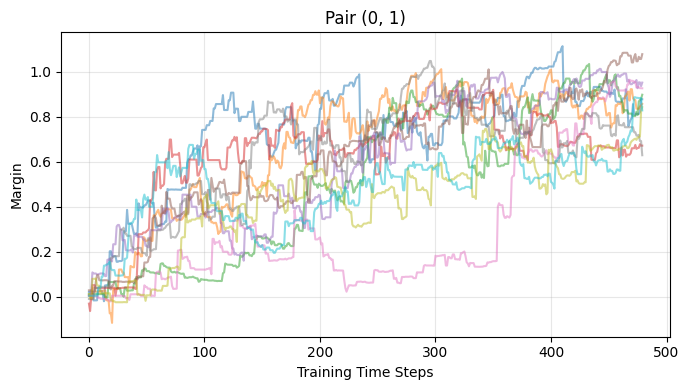

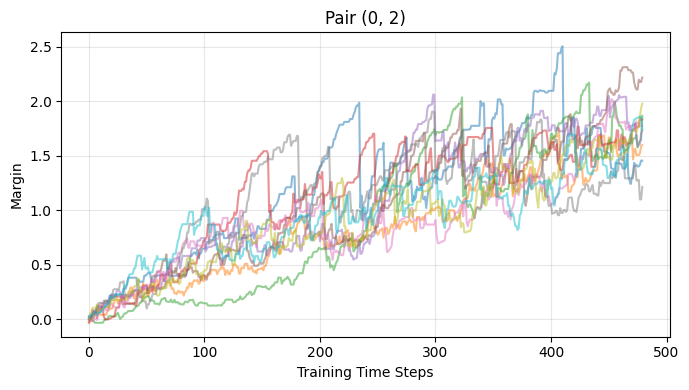

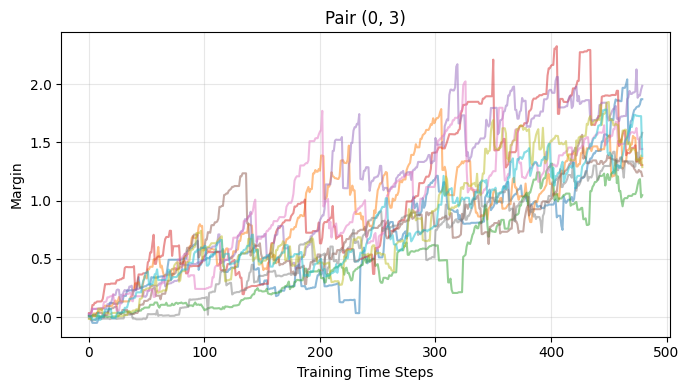

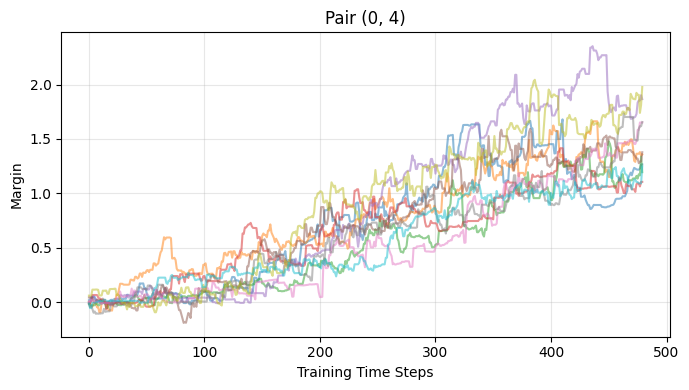

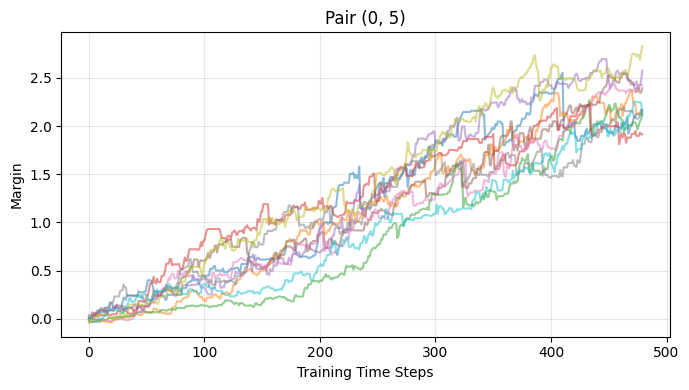

...

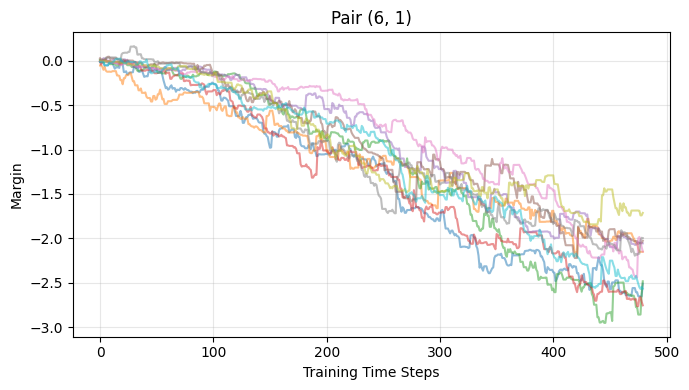

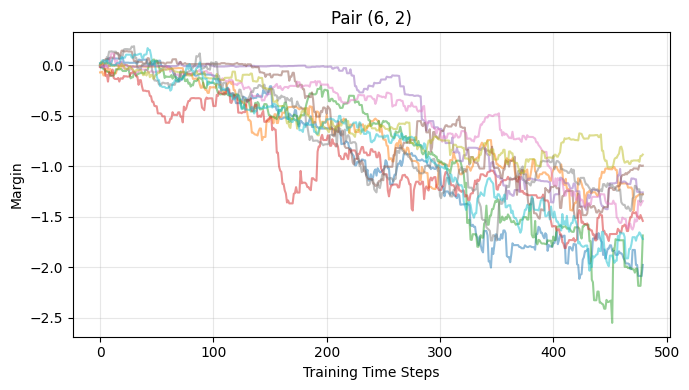

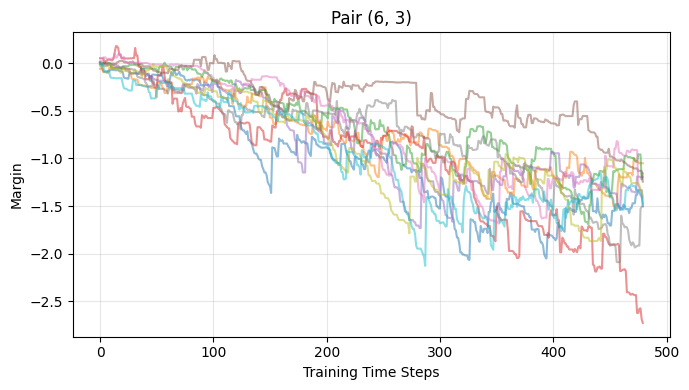

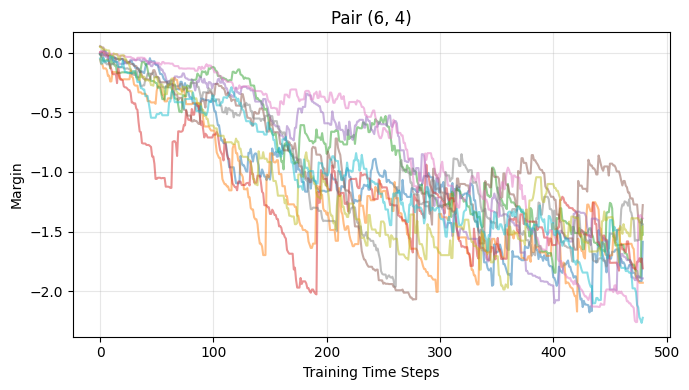

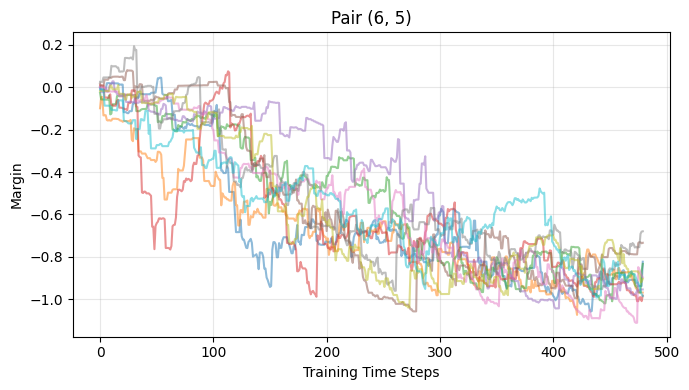

In [11]:
# Plot for every possible pair (i, j) in different figures
# If results is a tuple, unpack it to get the actual results dict
if isinstance(results, tuple):
    results = results[1]
training_progress = results["train"]["training_progress"]
seeds_n = training_progress.shape[0]
items_n = training_progress.shape[2]

for i in range(items_n):
    for j in range(items_n):
        if i == j:
            continue  # skip diagonal if desired
        plt.figure(figsize=(7,4))
        for seed in range(seeds_n):
            plt.plot(training_progress[seed, :480, i, j], alpha=0.5)
        plt.xlabel("Training Time Steps")
        plt.ylabel("Margin")
        plt.title(f"Pair ({i}, {j})")
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

In [ ]:
# Plot for every possible pair (i, j) in different figures
# If results is a tuple, unpack it to get the actual results dict
if isinstance(results, tuple):
    results = results[1]
training_progress = results["train"]["training_progress"]
seeds_n = training_progress.shape[0]
items_n = training_progress.shape[2]

for i in range(items_n):
    for j in range(items_n):
        if i == j:
            continue  # skip diagonal if desired
        plt.figure(figsize=(7,4))
        for seed in range(seeds_n):
            plt.plot(training_progress[seed, :480, i, j], alpha=0.5)
        plt.xlabel("Training Time Steps")
        plt.ylabel("Margin")
        plt.title(f"Pair ({i}, {j})")
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()

# Increase Training Time

In [17]:
# Experiment details
training_blocks = 16 if mode == "two-readouts" else 8
trials = 180 
training_length = 2 * training_blocks * trials
stitching_steps = 20

In [18]:
# Train network
results = train_networks_exp(0.1)

# Plot for every possible pair (i, j) in different figures
if isinstance(results, tuple):
    results = results[1]
training_progress = results["train"]["training_progress"]
seeds_n = training_progress.shape[0]
items_n = training_progress.shape[2]


Average margin grid (across seeds and time):
[[ 3.66329731e-03  4.02290647e-01  7.75857325e-01  7.14523838e-01
   6.78122614e-01  1.05248454e+00  1.45542085e+00]
 [-4.09581352e-01  1.00953198e-03  3.77318004e-01  3.18400148e-01
   2.75573268e-01  6.56966123e-01  1.05688807e+00]
 [-7.62795874e-01 -3.65243697e-01 -4.96664314e-03 -4.11181181e-02
  -9.05202710e-02  2.75406026e-01  6.74680160e-01]
 [-7.30633939e-01 -3.22168263e-01  3.07556336e-02 -7.26820450e-03
  -2.93590609e-02  3.23017912e-01  7.28420131e-01]
 [-6.94255489e-01 -2.91712779e-01  9.04370807e-02  2.16717425e-02
  -7.90221731e-04  3.76109875e-01  7.75724694e-01]
 [-1.05931805e+00 -6.51574877e-01 -2.96173602e-01 -3.40365125e-01
  -3.69006809e-01 -1.43174478e-03  4.05862884e-01]
 [-1.45791638e+00 -1.05052879e+00 -6.97717277e-01 -7.35445408e-01
  -7.62092741e-01 -4.01892172e-01 -2.49589742e-03]]


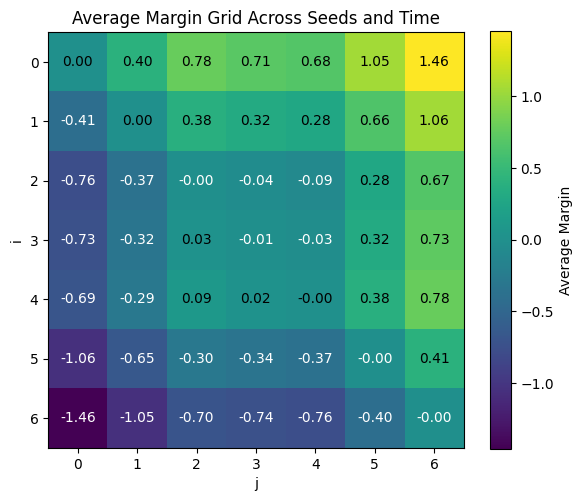

In [31]:
# Compute the average margin across seeds and time for each (i, j) pair
# Resulting in a grid of shape (items_n, items_n)
average_margin_grid = training_progress.mean(axis=(0, 1))
print("Average margin grid (across seeds and time):")
print(average_margin_grid)

# Plot the average margin grid as a heatmap with values over each rectangle
plt.figure(figsize=(6, 5))
im = plt.imshow(average_margin_grid, cmap='viridis', interpolation='nearest')
plt.colorbar(im, label="Average Margin")
plt.xlabel("j")
plt.ylabel("i")
plt.title("Average Margin Grid Across Seeds and Time")

# Add values in each cell
for i in range(average_margin_grid.shape[0]):
    for j in range(average_margin_grid.shape[1]):
        value = average_margin_grid[i, j]
        plt.text(j, i, f"{value:.2f}", ha='center', va='center', color='white' if im.norm(value) < 0.5 else 'black')

plt.tight_layout()
plt.show()






Corrected average margin grid (with (4,2) and (2,4) flipped):
[[ 3.66329731e-03  4.02290647e-01  7.75857325e-01  7.14523838e-01
   6.78122614e-01  1.05248454e+00  1.45542085e+00]
 [-4.09581352e-01  1.00953198e-03  3.77318004e-01  3.18400148e-01
   2.75573268e-01  6.56966123e-01  1.05688807e+00]
 [-7.62795874e-01 -3.65243697e-01 -4.96664314e-03 -4.11181181e-02
   9.05202710e-02  2.75406026e-01  6.74680160e-01]
 [-7.30633939e-01 -3.22168263e-01  3.07556336e-02 -7.26820450e-03
  -2.93590609e-02  3.23017912e-01  7.28420131e-01]
 [-6.94255489e-01 -2.91712779e-01 -9.04370807e-02  2.16717425e-02
  -7.90221731e-04  3.76109875e-01  7.75724694e-01]
 [-1.05931805e+00 -6.51574877e-01 -2.96173602e-01 -3.40365125e-01
  -3.69006809e-01 -1.43174478e-03  4.05862884e-01]
 [-1.45791638e+00 -1.05052879e+00 -6.97717277e-01 -7.35445408e-01
  -7.62092741e-01 -4.01892172e-01 -2.49589742e-03]]


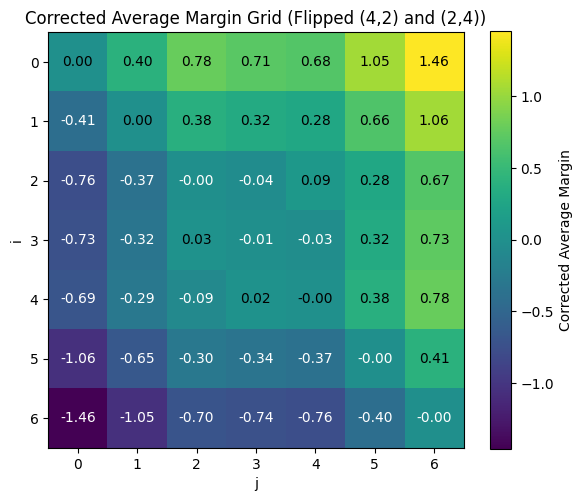

In [32]:
# Create a "correct" average margin grid where (4,2) and (2,4) entries are multiplied by -1
correct_margin_grid = average_margin_grid.copy()
correct_margin_grid[4, 2] *= -1
correct_margin_grid[2, 4] *= -1

print("Corrected average margin grid (with (4,2) and (2,4) flipped):")
print(correct_margin_grid)

# Plot the corrected average margin grid as a heatmap with values over each rectangle
plt.figure(figsize=(6, 5))
im_correct = plt.imshow(correct_margin_grid, cmap='viridis', interpolation='nearest')
plt.colorbar(im_correct, label="Corrected Average Margin")
plt.xlabel("j")
plt.ylabel("i")
plt.title("Corrected Average Margin Grid (Flipped (4,2) and (2,4))")

# Add values in each cell
for i in range(correct_margin_grid.shape[0]):
    for j in range(correct_margin_grid.shape[1]):
        value = correct_margin_grid[i, j]
        plt.text(j, i, f"{value:.2f}", ha='center', va='center', color='white' if im_correct.norm(value) < 0.5 else 'black')

plt.tight_layout()
plt.show()

In [34]:
1 / (1 + np.exp(-.09))

np.float64(0.5224848247918001)

Sigmoid of corrected average margin grid:
[[0.50091582 0.59923789 0.68478659 0.67139999 0.66331956 0.74125171
  0.81083131]
 [0.39901251 0.50025238 0.59322608 0.57893431 0.56846062 0.65857854
  0.7420954 ]
 [0.31803956 0.40969081 0.49875834 0.48972192 0.52261463 0.56841959
  0.66255033]
 [0.32505563 0.42014742 0.5076883  0.49818296 0.49266076 0.58005956
  0.67445849]
 [0.33308709 0.4275846  0.47740613 0.50541772 0.49980244 0.59293451
  0.68475796]
 [0.2574398  0.34263473 0.42649314 0.41572079 0.40878103 0.49964206
  0.60009546]
 [0.18878622 0.25912357 0.33231853 0.32400091 0.31819208 0.40085781
  0.49937603]]


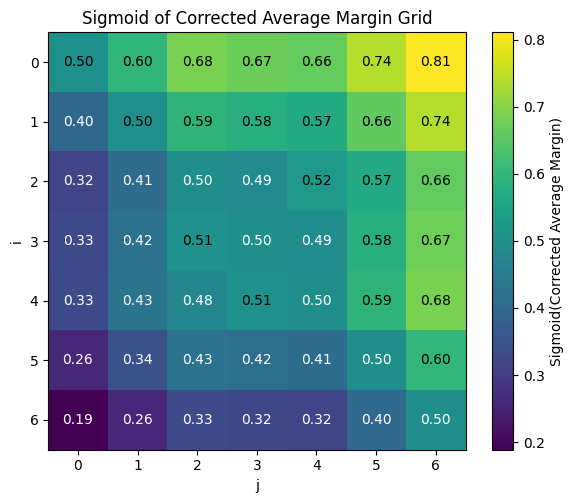

In [35]:
# Compute the sigmoid of the corrected average margin grid
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

sigmoid_correct_margin_grid = sigmoid(correct_margin_grid)

print("Sigmoid of corrected average margin grid:")
print(sigmoid_correct_margin_grid)

# Plot the sigmoid margin grid as a heatmap with values in each cell
plt.figure(figsize=(6, 5))
im_sigmoid_correct = plt.imshow(sigmoid_correct_margin_grid, cmap='viridis', interpolation='nearest')
plt.colorbar(im_sigmoid_correct, label="Sigmoid(Corrected Average Margin)")
plt.xlabel("j")
plt.ylabel("i")
plt.title("Sigmoid of Corrected Average Margin Grid")

# Add values in each cell
for i in range(sigmoid_correct_margin_grid.shape[0]):
    for j in range(sigmoid_correct_margin_grid.shape[1]):
        value = sigmoid_correct_margin_grid[i, j]
        plt.text(j, i, f"{value:.2f}", ha='center', va='center', color='white' if im_sigmoid_correct.norm(value) < 0.5 else 'black')

plt.tight_layout()
plt.show()


In [26]:
training_progress.shape[1]

2880

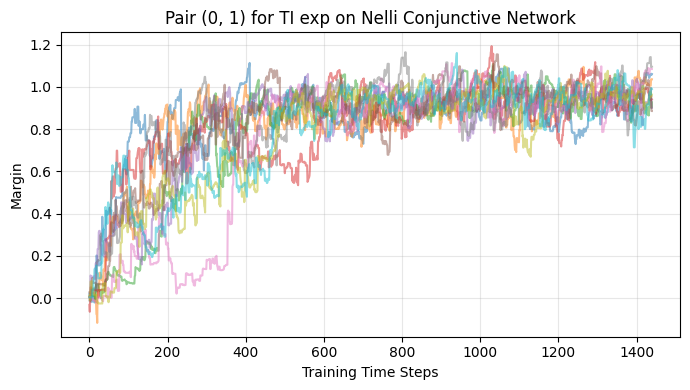

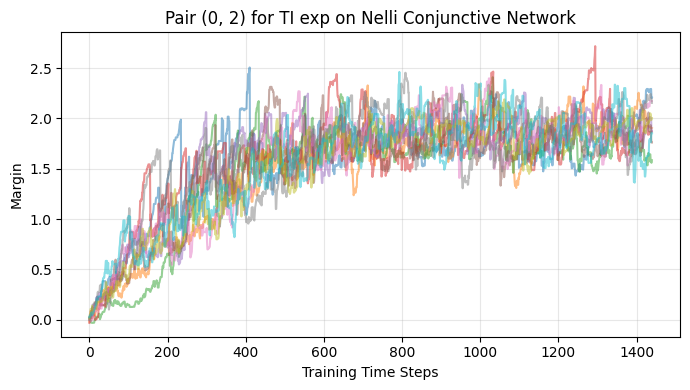

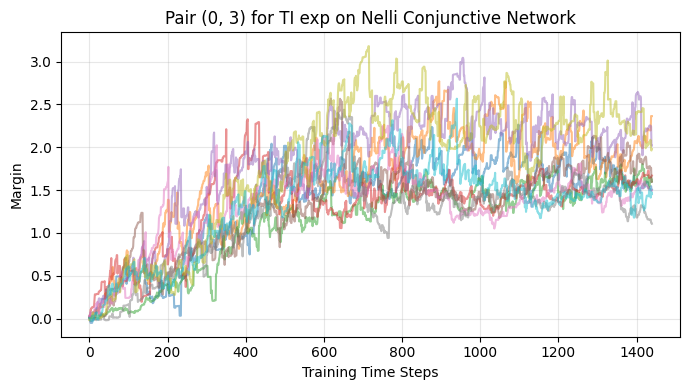

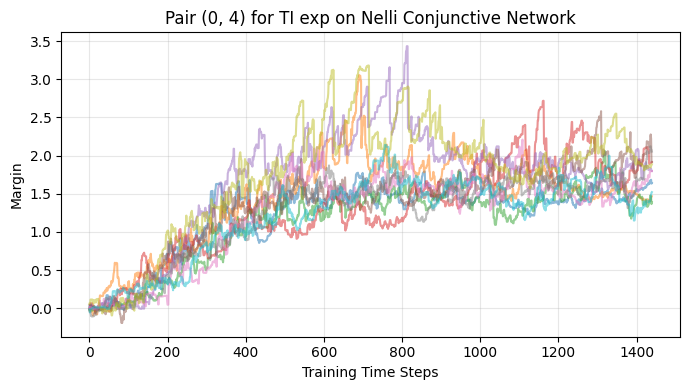

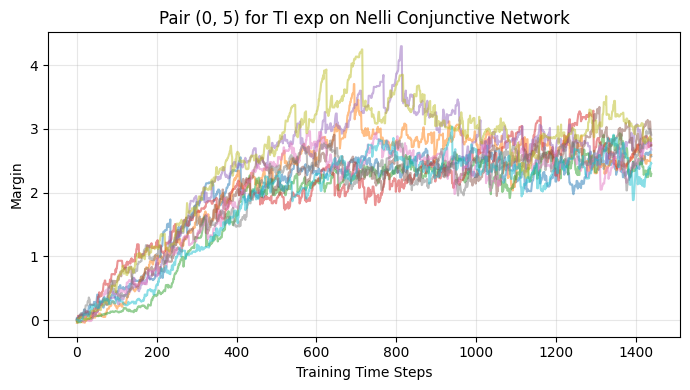

...

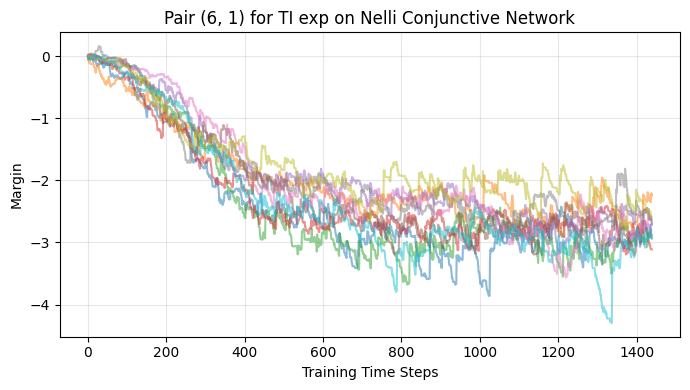

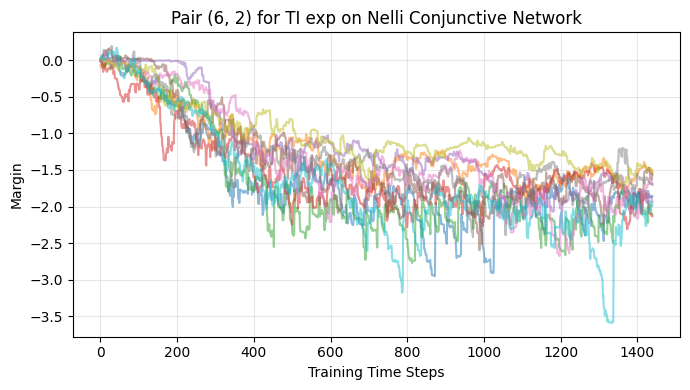

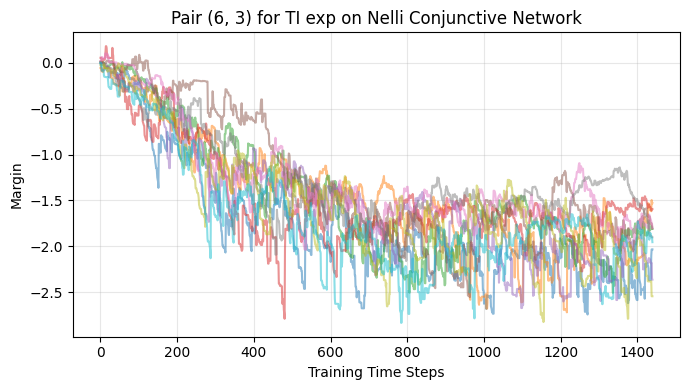

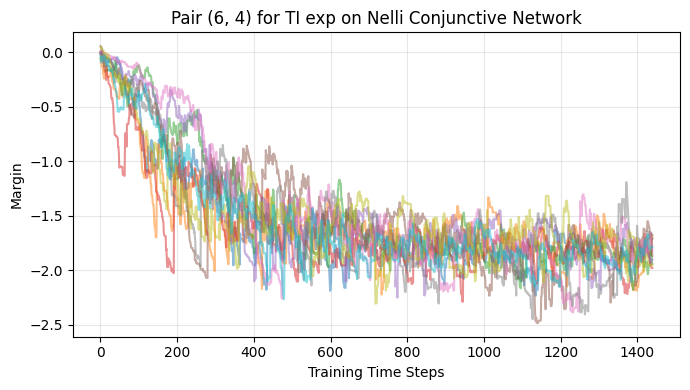

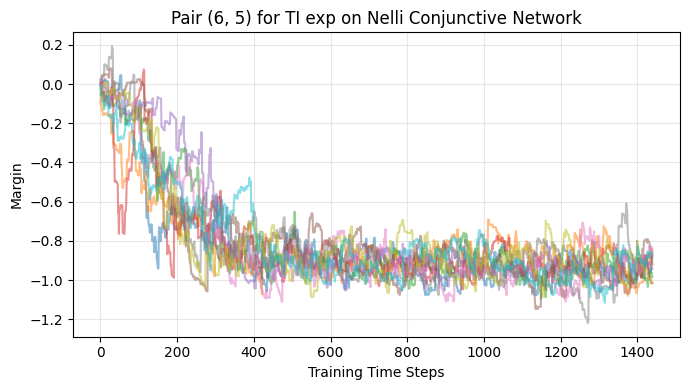

In [19]:
for i in range(items_n):
    for j in range(items_n):
        if i == j:
            continue  # skip diagonal if desired
        plt.figure(figsize=(7,4))
        for seed in range(seeds_n):
            plt.plot(training_progress[seed, :480*3, i, j], alpha=0.5)
        plt.xlabel("Training Time Steps")
        plt.ylabel("Margin")
        plt.title(f"Pair ({i}, {j}) for TI exp on Nelli Conjunctive Network")
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()


In [12]:
import csv

# Extract training pair results and save to CSV
# We'll save the average margin over seeds for each pair (i, j) at each time step

# If results is a tuple, unpack it to get the actual results dict
if isinstance(results, tuple):
    results = results[1]
training_progress = results["train"]["training_progress"]  # shape: (seeds_n, time_steps, items_n, items_n)
seeds_n, time_steps, items_n, _ = training_progress.shape

# Prepare CSV header
header = ["time_step", "i", "j"] + [f"seed_{seed}" for seed in range(seeds_n)] + ["mean_margin", "std_margin"]

rows = []
for i in range(items_n):
    for j in range(items_n):
        for t in range(time_steps):
            margins = training_progress[:, t, i, j]
            mean_margin = margins.mean()
            std_margin = margins.std()
            row = [t, i, j] + list(margins) + [mean_margin, std_margin]
            rows.append(row)

# Write to CSV
# 'network' here refers to a variable defined earlier in the notebook, not to the class 'nellinetwork'.
csv_filename = f"training_pair_margins_{training_length}_nellinetworkconjunctive.csv"
with open(csv_filename, mode="w", newline="") as f:
    writer = csv.writer(f)
    writer.writerow(header)
    writer.writerows(rows)

print(f"Training pair results saved to {csv_filename}")

print()


Training pair results saved to training_pair_margins_960_nellinetworkconjunctive.csv



In [13]:
import pandas as pd

# Read the CSV file with training pair margins
df = pd.read_csv(csv_filename)

# Display the first few rows to verify extraction
print("Extracted results from CSV:")
print(df.head())

# Now 'df' contains the extracted results and can be used for further analysis or plotting


Extracted results from CSV:
   time_step  i  j    seed_0    seed_1    seed_2    seed_3    seed_4  \
0          0  0  0  0.018839 -0.000723  0.000043  0.007739 -0.007525   
1          1  0  0  0.018840 -0.000722  0.000045  0.007738 -0.007527   
2          2  0  0  0.018837 -0.000723  0.000044  0.008565 -0.007736   
3          3  0  0  0.018834 -0.000724  0.000043  0.008278 -0.007431   
4          4  0  0  0.018834 -0.000173 -0.001230  0.008277 -0.007430   

     seed_5    seed_6    seed_7    seed_8    seed_9  mean_margin  std_margin  
0  0.010447  0.023755 -0.001554  0.002013  0.008134     0.006117    0.009186  
1  0.010448  0.023755 -0.001555  0.002012  0.008133     0.006117    0.009187  
2  0.010449  0.023755 -0.001556  0.002013  0.008134     0.006178    0.009236  
3  0.010450  0.023756 -0.001557  0.001803  0.008137     0.006159    0.009193  
4  0.010448  0.023755 -0.001558  0.001611  0.008134     0.006067    0.009255  


Figure out keyerror on t issue

In [14]:
import numpy as np

print("Columns in DataFrame:", df.columns.tolist())

# Try to find the correct time, i, j column names
# The original code expects 't', but the CSV uses 'time_step'
# Let's map accordingly
col_map = {}
for col in df.columns:
    if col.lower() in ['t', 'time', 'time_step']:
        col_map['t'] = col
    if col.lower() == 'i':
        col_map['i'] = col
    if col.lower() == 'j':
        col_map['j'] = col

# Use mapped column names
t_col = col_map.get('t', 'time_step')
i_col = col_map.get('i', 'i')
j_col = col_map.get('j', 'j')

df_sorted = df.sort_values([t_col, i_col, j_col]).reset_index(drop=True)

# The number of margin columns is seeds_n
margin_cols = [col for col in df.columns if col not in [t_col, i_col, j_col, 'mean_margin', 'std_margin']]
seeds_n = len(margin_cols)
time_steps = df[t_col].max() + 1  # assumes t is 0-based and contiguous
items_n = max(df[i_col].max(), df[j_col].max()) + 1  # assuming 0-based indexing

# Initialize training_progress array
training_progress = np.zeros((seeds_n, time_steps, items_n, items_n))

# Fill the array
for idx, row in df.iterrows():
    t = int(row[t_col])
    i = int(row[i_col])
    j = int(row[j_col])
    for s, col in enumerate(margin_cols):
        training_progress[s, t, i, j] = row[col]

Columns in DataFrame: ['time_step', 'i', 'j', 'seed_0', 'seed_1', 'seed_2', 'seed_3', 'seed_4', 'seed_5', 'seed_6', 'seed_7', 'seed_8', 'seed_9', 'mean_margin', 'std_margin']


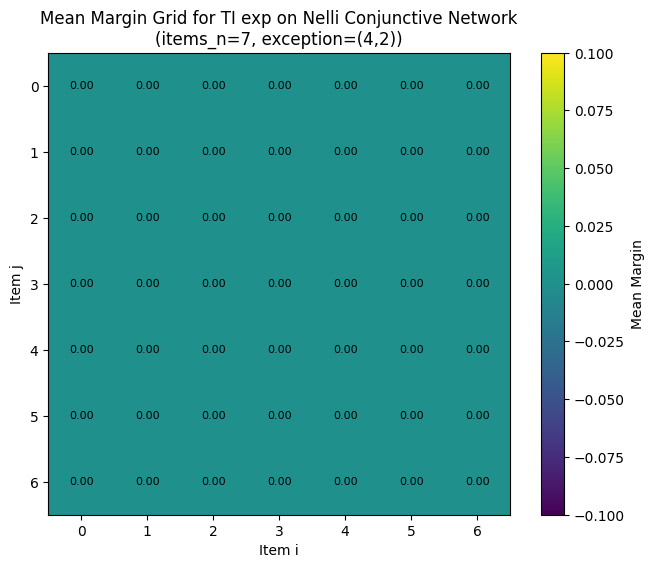

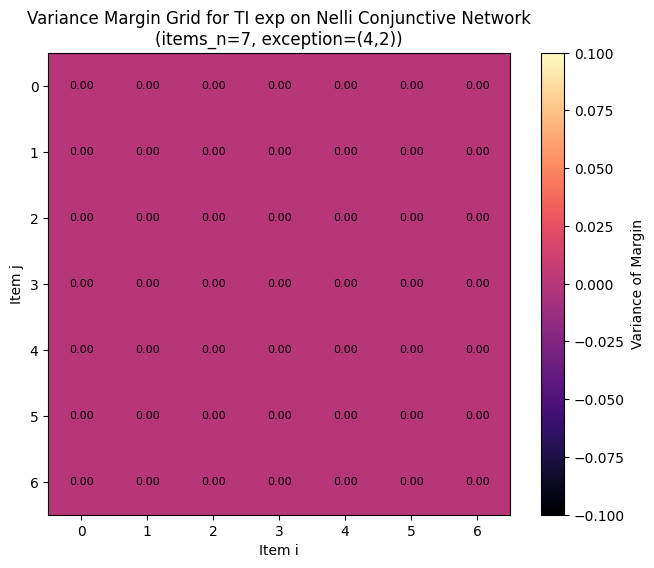

In [27]:
items_per_context = 7
p = 4
q = 2

if isinstance(results, tuple):
    results = results[1]
n = items_n
Grid = np.zeros((seeds_n, n, n))
for seed in range(seeds_n):
    for i in range(n):
        for j in range(n):
            Grid[seed, i, j] = training_progress[seed, training_progress.shape[1]-1, i, j]
Average_Grid = np.mean(Grid, axis=0)
Std_Grid = np.var(Grid, axis=0)

plt.figure(figsize=(8, 6))
plt.imshow(Average_Grid, cmap='viridis', interpolation='none')
plt.colorbar(label='Mean Margin')
plt.title(f'Mean Margin Grid for TI exp on Nelli Conjunctive Network\n(items_n={items_n}, exception=({p},{q}))')
plt.xlabel('Item i')
plt.ylabel('Item j')
plt.xticks(range(n))
plt.yticks(range(n))

# Plot mean numbers over each square
for i in range(n):
    for j in range(n):
        plt.text(j, i, f"{Average_Grid[i, j]:.2f}", ha='center', va='center', color='white' if Average_Grid[i, j] < (Average_Grid.max() / 2) else 'black', fontsize=8)
plt.show()

plt.figure(figsize=(8, 6))
plt.imshow(Std_Grid, cmap='magma', interpolation='none')
plt.colorbar(label='Variance of Margin')
plt.title(f'Variance Margin Grid for TI exp on Nelli Conjunctive Network\n(items_n={items_n}, exception=({p},{q}))')
plt.xlabel('Item i')
plt.ylabel('Item j')
plt.xticks(range(n))
plt.yticks(range(n))
# Plot variance numbers over each square
for i in range(n):
    for j in range(n):
        plt.text(j, i, f"{Std_Grid[i, j]:.2f}", ha='center', va='center', color='white' if Average_Grid[i, j] < (Average_Grid.max() / 2) else 'black', fontsize=8)
plt.show()


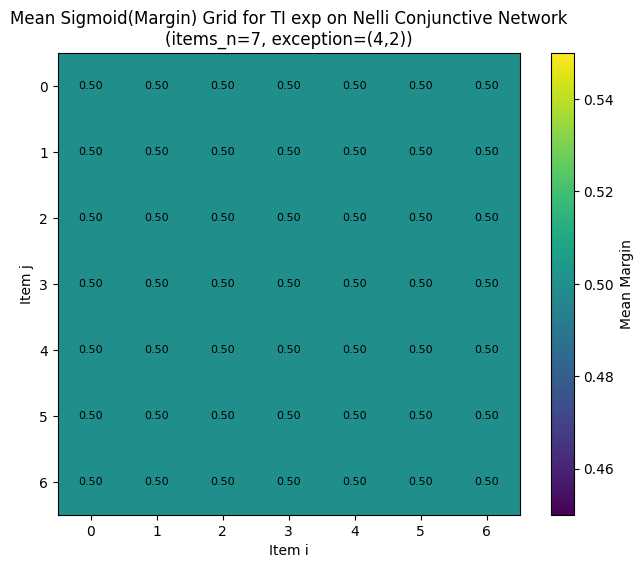

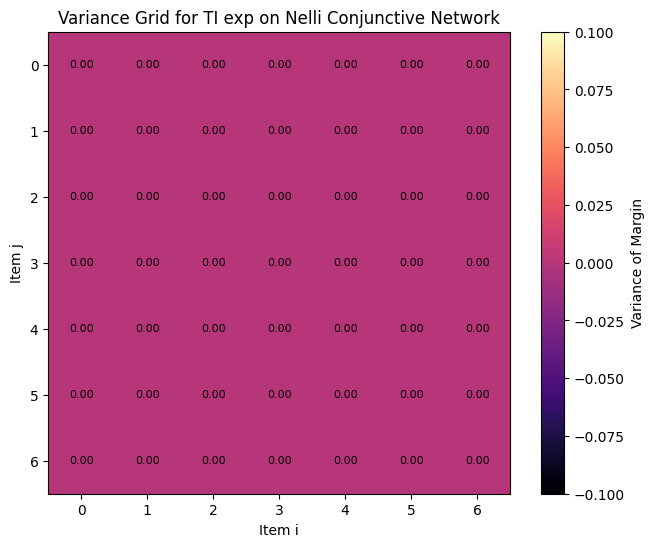

In [20]:
# if isinstance(results, tuple):
    # results = results[1]
# training_progress = results["train"]["training_progress"]
n = items_n
Grid = np.zeros((seeds_n, n, n))
for seed in range(seeds_n):
    for i in range(n):
        for j in range(n):
            Grid[seed, i, j] = training_progress[seed, training_length - 1, i, j]
Average_Grid = np.mean(Grid, axis=0)
# Apply sigmoid function to Average_Grid
Average_Grid = 1 / (1 + np.exp(-Average_Grid))
Std_Grid = np.var(Grid, axis=0)

plt.figure(figsize=(8, 6))
plt.imshow(Average_Grid, cmap='viridis', interpolation='none')
plt.colorbar(label='Mean Margin')
plt.title(f'Mean Sigmoid(Margin) Grid for TI exp on Nelli Conjunctive Network\n(items_n={items_n}, exception=({p},{q}))')
plt.xlabel('Item i')
plt.ylabel('Item j')
plt.xticks(range(n))
plt.yticks(range(n))
# Plot mean numbers over each square
for i in range(n):
    for j in range(n):
        plt.text(j, i, f"{Average_Grid[i, j]:.2f}", ha='center', va='center', color='white' if Average_Grid[i, j] < (Average_Grid.max() / 2) else 'black', fontsize=8)
plt.show()

plt.figure(figsize=(8, 6))
plt.imshow(Std_Grid, cmap='magma', interpolation='none')
plt.colorbar(label='Variance of Margin')
plt.title('Variance Grid for TI exp on Nelli Conjunctive Network')
plt.xlabel('Item i')
plt.ylabel('Item j')
plt.xticks(range(n))
plt.yticks(range(n))
# Plot variance numbers over each square
for i in range(n):
    for j in range(n):
        plt.text(j, i, f"{Std_Grid[i, j]:.2f}", ha='center', va='center', color='white' if Average_Grid[i, j] < (Average_Grid.max() / 2) else 'black', fontsize=8)
plt.show()